# Inferencing

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [2]:
print("start")

start


# Training Data

           Predicted thick ice  Predicted thin ice  Predicted water
thick ice               198347                8074              316
thin ice                  1418                7745              925
water                       82                1981             3968


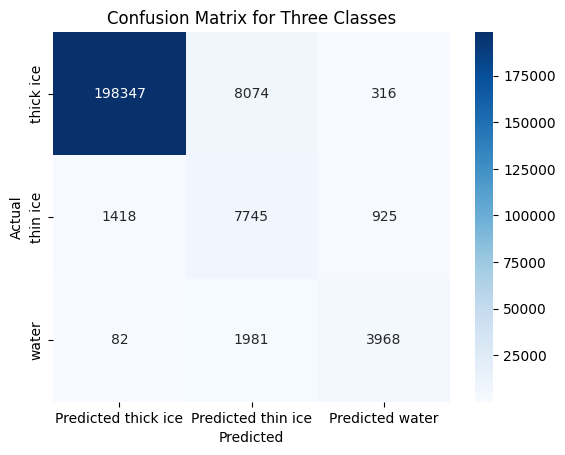

           Predicted thick ice  Predicted thin ice  Predicted water
thick ice            95.941704            3.905445         0.152851
thin ice             14.056305           76.774385         9.169310
water                 1.359642           32.846957        65.793401


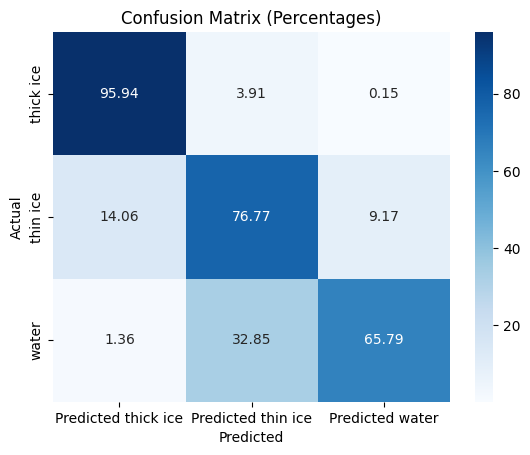

In [3]:
# #train data cor label
dataset_accu = pd.read_csv("ATL03_labeled_data/ATL03_cor_label_LSTM_ann_prepared.csv")
dataset_accu
# separate features and labels
lstm_features = dataset_accu.copy()
lstm_labels = lstm_features.pop('label')
lstm_track = lstm_features.pop('track')
#training data cor label
dataset_pred = pd.read_csv("data_norm_cor_label_lstm_features_pred_training.csv")
# dataset_pred = pd.read_csv("lstm_model_31102024/data_norm_cor_label_lstm_features_pred_training.csv")

dataset_pred
dataset_pred['label'] = np.argmax(dataset_pred[['label0', 'label1', 'label2']].values, axis=1)
dataset_pred['pred_label'] = np.argmax(dataset_pred[['pred_label0', 'pred_label1', 'pred_label2']].values, axis=1)
#dataset_pred.rename(columns={'h_cor_mean0': 'h_cor_mean', 'height_sd0': 'height_sd', 'pcnth_mean0': 'pcnth_mean', 'pcnt_mean0': 'pcnt_mean'}, inplace=True)
#dataset_pred
dataset_pred['h_cor_mean'] = lstm_features['h_cor_mean0']
dataset_pred['h_diff'] = lstm_features['h_diff0']
dataset_pred['rel_height_min_elev'] = lstm_features['rel_height_min_elev0']
dataset_pred['height_sd'] = lstm_features['height_sd0']
dataset_pred['pcnth_mean'] = lstm_features['pcnth_mean0']
dataset_pred['pcnt_mean'] = lstm_features['pcnt_mean0']
dataset_pred['bcnt_mean'] = lstm_features['bcnt_mean0']
dataset_pred['brate_mean'] = lstm_features['brate_mean0']
dataset_pred['track'] = lstm_track
# Find the number of rows where column 'a' is equal to column 'b'
matching_rows = dataset_pred[dataset_pred['pred_label'] == dataset_pred['label']]

# Count the number of matching rows
num_matching_rows = len(matching_rows)

# Calculate confusion matrix
cm = confusion_matrix(dataset_pred['label'], dataset_pred['pred_label'], labels=[0, 1, 2])

# Create a DataFrame for visualization
cm_df = pd.DataFrame(cm, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# Print the confusion matrix
print(cm_df)

# Optional: Visualize the confusion matrix
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix for Three Classes')
plt.show()

# Normalize the confusion matrix by row (true labels)
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Create a DataFrame for visualization
cm_df = pd.DataFrame(cm_percentage, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# Print the confusion matrix
print(cm_df)

# Optional: Visualize the confusion matrix
sns.heatmap(cm_df, annot=True, fmt='.2f', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix (Percentages)')
plt.show()

# All data

In [4]:
#All data
dataset_accu = pd.read_csv("ATL03_labeled_data/ATL03_ow_labeled_10m_5km_corrected_new_sea_surface_LSTM_ann_prepared_new_param_2.csv")
dataset_accu
# #training data
# dataset_accu = pd.read_csv("ATL03_labeled_data/ATL03_ow_labeled_10m_5km_corrected_new_sea_surface_LSTM_ann_prepared_new_param_threshold.csv")
# dataset_accu
# #train data cor label
# dataset_accu = pd.read_csv("ATL03_labeled_data/ATL03_cor_label_LSTM_ann_prepared.csv")
# dataset_accu
# separate features and labels
lstm_features = dataset_accu.copy()
lstm_labels = lstm_features.pop('label')
lstm_track = lstm_features.pop('track')
lstm_features

,Unnamed: 0,h_cor_mean-2,h_diff-2,rel_height_min_elev-2,height_sd-2,pcnth_mean-2,pcnt_mean-2,bcnt_mean-2,brate_mean-2,h_cor_mean-1,...,bcnt_mean1,brate_mean1,h_cor_mean2,h_diff2,rel_height_min_elev2,height_sd2,pcnth_mean2,pcnt_mean2,bcnt_mean2,brate_mean2
0,0,0.637049,-0.015766,0.185182,0.082355,3.000000,4.500000,1076.0,5450947.5,0.679456,...,1076.000000,5.450948e+06,0.610320,0.007412,0.158453,0.067461,2.500000,3.500000,1076.000000,5.450948e+06
1,1,0.679456,-0.009308,0.227590,0.047031,1.666667,3.666667,1076.0,5450947.5,0.723813,...,1076.000000,5.450948e+06,0.726380,0.008011,0.274513,0.019368,1.666667,5.000000,1076.000000,5.450948e+06
2,2,0.723813,0.000000,0.271946,0.000000,1.000000,4.000000,1076.0,5450947.5,0.729230,...,1076.000000,5.450948e+06,0.545018,-0.008102,0.093151,0.103501,3.333333,5.000000,1076.000000,5.450948e+06
3,3,0.729230,0.000000,0.277363,0.000000,1.000000,2.000000,1076.0,5450947.5,0.610320,...,1076.000000,5.450948e+06,0.611392,-0.031940,0.159525,0.126779,3.000000,5.571429,1065.285714,5.372250e+06
4,4,0.610320,0.007412,0.158453,0.067461,2.500000,3.500000,1076.0,5450947.5,0.726380,...,1065.285714,5.372250e+06,0.557143,-0.017227,0.105277,0.127518,2.500000,4.250000,1061.000000,5.340770e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,20526,1.248831,-0.048645,0.639795,0.270227,5.133333,7.000000,1244.6,4825973.3,1.410490,...,1292.000000,5.137216e+06,1.647001,-0.057137,1.037966,0.246471,4.555556,7.000000,1292.000000,5.137216e+06
1303681,20527,1.410490,-0.039787,0.801454,0.299490,4.636364,7.000000,1292.0,5137215.5,1.521043,...,1292.000000,5.137216e+06,1.533705,-0.096931,0.924669,0.247331,9.000000,11.000000,1292.000000,5.137216e+06
1303682,20528,1.521043,-0.016685,0.912007,0.192664,5.375000,6.000000,1292.0,5137215.5,1.517701,...,1292.000000,5.137216e+06,1.600905,-0.024689,0.991870,0.195343,8.583333,11.416667,1292.000000,5.137216e+06
1303683,20529,1.517701,-0.052460,0.908665,0.244665,7.727273,10.636364,1292.0,5137215.5,1.647001,...,1292.000000,5.137216e+06,1.428459,-0.026390,0.819424,0.242420,7.000000,11.157895,1292.000000,5.137216e+06


In [5]:
#prediction data
# dataset_pred = pd.read_csv("data_norm_lstm_features_pred_threshold.csv")
# dataset_pred
#prediction data
dataset_pred = pd.read_csv("data_norm_cor_label_lstm_features_pred.csv")
dataset_pred
#training data cor label
# dataset_pred = pd.read_csv("data_norm_cor_label_lstm_features_pred_training.csv")
# dataset_pred

,Unnamed: 0,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,pred_label0,pred_label1,pred_label2,label0,label1,label2
0,0,-0.504558,0.011273,-0.470475,-0.193696,4.197687,1.493985,1.404336,0.628328,0.594732,0.349306,0.055962,1.0,0.0,0.0
1,1,-0.494123,0.011273,-0.459865,-0.193696,4.197687,1.834788,1.404336,0.628328,0.604602,0.348003,0.047395,1.0,0.0,0.0
2,2,-0.723170,0.019030,-0.692768,-0.119177,3.106335,1.579186,1.404336,0.628328,0.602087,0.348437,0.049476,1.0,0.0,0.0
3,3,-0.499613,0.019657,-0.465447,-0.172302,3.712641,1.323583,1.404336,0.628328,0.595997,0.349153,0.054851,1.0,0.0,0.0
4,4,-0.848956,0.002793,-0.820672,-0.079367,2.500029,1.323583,1.404336,0.628328,0.582427,0.356401,0.061172,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1.031080,-0.006189,0.783182,0.019123,1.014578,1.153181,0.732105,0.845848,0.731991,0.267102,0.000906,NaN,NaN,NaN
1303681,1303681,1.024642,-0.043630,0.776636,0.076564,-0.696860,0.363137,0.732105,0.845848,0.774369,0.225501,0.000130,NaN,NaN,NaN
1303682,1303682,1.273703,-0.048525,1.029891,0.078559,1.610779,0.982779,0.732105,0.845848,0.777440,0.222452,0.000108,NaN,NaN,NaN
1303683,1303683,1.055470,-0.090173,0.807983,0.079508,-1.622855,0.301172,0.732105,0.845848,0.692066,0.303281,0.004654,NaN,NaN,NaN


In [6]:
dataset_pred['label'] = np.argmax(dataset_pred[['label0', 'label1', 'label2']].values, axis=1)
dataset_pred['pred_label'] = np.argmax(dataset_pred[['pred_label0', 'pred_label1', 'pred_label2']].values, axis=1)
dataset_pred

,Unnamed: 0,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,pred_label0,pred_label1,pred_label2,label0,label1,label2,label,pred_label
0,0,-0.504558,0.011273,-0.470475,-0.193696,4.197687,1.493985,1.404336,0.628328,0.594732,0.349306,0.055962,1.0,0.0,0.0,0,0
1,1,-0.494123,0.011273,-0.459865,-0.193696,4.197687,1.834788,1.404336,0.628328,0.604602,0.348003,0.047395,1.0,0.0,0.0,0,0
2,2,-0.723170,0.019030,-0.692768,-0.119177,3.106335,1.579186,1.404336,0.628328,0.602087,0.348437,0.049476,1.0,0.0,0.0,0,0
3,3,-0.499613,0.019657,-0.465447,-0.172302,3.712641,1.323583,1.404336,0.628328,0.595997,0.349153,0.054851,1.0,0.0,0.0,0,0
4,4,-0.848956,0.002793,-0.820672,-0.079367,2.500029,1.323583,1.404336,0.628328,0.582427,0.356401,0.061172,1.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1.031080,-0.006189,0.783182,0.019123,1.014578,1.153181,0.732105,0.845848,0.731991,0.267102,0.000906,NaN,NaN,NaN,0,0
1303681,1303681,1.024642,-0.043630,0.776636,0.076564,-0.696860,0.363137,0.732105,0.845848,0.774369,0.225501,0.000130,NaN,NaN,NaN,0,0
1303682,1303682,1.273703,-0.048525,1.029891,0.078559,1.610779,0.982779,0.732105,0.845848,0.777440,0.222452,0.000108,NaN,NaN,NaN,0,0
1303683,1303683,1.055470,-0.090173,0.807983,0.079508,-1.622855,0.301172,0.732105,0.845848,0.692066,0.303281,0.004654,NaN,NaN,NaN,0,0


In [7]:
#dataset_pred.rename(columns={'h_cor_mean0': 'h_cor_mean', 'height_sd0': 'height_sd', 'pcnth_mean0': 'pcnth_mean', 'pcnt_mean0': 'pcnt_mean'}, inplace=True)
#dataset_pred
dataset_pred['h_cor_mean'] = lstm_features['h_cor_mean0']
dataset_pred['h_diff'] = lstm_features['h_diff0']
dataset_pred['rel_height_min_elev'] = lstm_features['rel_height_min_elev0']
dataset_pred['height_sd'] = lstm_features['height_sd0']
dataset_pred['pcnth_mean'] = lstm_features['pcnth_mean0']
dataset_pred['pcnt_mean'] = lstm_features['pcnt_mean0']
dataset_pred['bcnt_mean'] = lstm_features['bcnt_mean0']
dataset_pred['brate_mean'] = lstm_features['brate_mean0']
dataset_pred['track'] = lstm_track

dataset_pred

,Unnamed: 0,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,pred_label0,...,pred_label,h_cor_mean,h_diff,rel_height_min_elev,height_sd,pcnth_mean,pcnt_mean,bcnt_mean,brate_mean,track
0,0,-0.504558,0.011273,-0.470475,-0.193696,4.197687,1.493985,1.404336,0.628328,0.594732,...,0,0.723813,0.000000,0.271946,0.000000,1.000000,4.000000,1076.0,5450947.5,gt1r
1,1,-0.494123,0.011273,-0.459865,-0.193696,4.197687,1.834788,1.404336,0.628328,0.604602,...,0,0.729230,0.000000,0.277363,0.000000,1.000000,2.000000,1076.0,5450947.5,gt1r
2,2,-0.723170,0.019030,-0.692768,-0.119177,3.106335,1.579186,1.404336,0.628328,0.602087,...,0,0.610320,0.007412,0.158453,0.067461,2.500000,3.500000,1076.0,5450947.5,gt1r
3,3,-0.499613,0.019657,-0.465447,-0.172302,3.712641,1.323583,1.404336,0.628328,0.595997,...,0,0.726380,0.008011,0.274513,0.019368,1.666667,5.000000,1076.0,5450947.5,gt1r
4,4,-0.848956,0.002793,-0.820672,-0.079367,2.500029,1.323583,1.404336,0.628328,0.582427,...,0,0.545018,-0.008102,0.093151,0.103501,3.333333,5.000000,1076.0,5450947.5,gt1r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1.031080,-0.006189,0.783182,0.019123,1.014578,1.153181,0.732105,0.845848,0.731991,...,0,1.521043,-0.016685,0.912007,0.192664,5.375000,6.000000,1292.0,5137215.5,gt2r
1303681,1303681,1.024642,-0.043630,0.776636,0.076564,-0.696860,0.363137,0.732105,0.845848,0.774369,...,0,1.517701,-0.052460,0.908665,0.244665,7.727273,10.636364,1292.0,5137215.5,gt2r
1303682,1303682,1.273703,-0.048525,1.029891,0.078559,1.610779,0.982779,0.732105,0.845848,0.777440,...,0,1.647001,-0.057137,1.037966,0.246471,4.555556,7.000000,1292.0,5137215.5,gt2r
1303683,1303683,1.055470,-0.090173,0.807983,0.079508,-1.622855,0.301172,0.732105,0.845848,0.692066,...,0,1.533705,-0.096931,0.924669,0.247331,9.000000,11.000000,1292.0,5137215.5,gt2r


In [8]:
# Find the number of rows where column 'a' is equal to column 'b'
matching_rows = dataset_pred[dataset_pred['pred_label'] == dataset_pred['label']]

# Count the number of matching rows
num_matching_rows = len(matching_rows)
num_matching_rows

1155157

           Predicted thick ice  Predicted thin ice  Predicted water
thick ice              1154025               86020            47521
thin ice                  8952                 924              212
water                     5053                 770              208


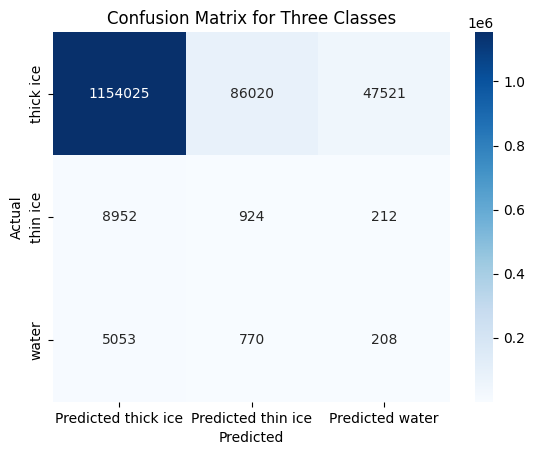

           Predicted thick ice  Predicted thin ice  Predicted water
thick ice            89.628415            6.680823         3.690762
thin ice             88.739096            9.159397         2.101507
water                83.783784           12.767369         3.448848


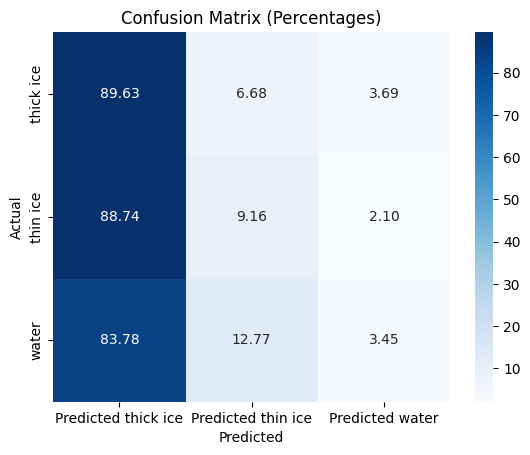

In [9]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate confusion matrix
cm = confusion_matrix(dataset_pred['label'], dataset_pred['pred_label'], labels=[0, 1, 2])

# Create a DataFrame for visualization
cm_df = pd.DataFrame(cm, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# Print the confusion matrix
print(cm_df)

# Optional: Visualize the confusion matrix
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix for Three Classes')
plt.show()




# Normalize the confusion matrix by row (true labels)
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Create a DataFrame for visualization
cm_df = pd.DataFrame(cm_percentage, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# Print the confusion matrix
print(cm_df)

# Optional: Visualize the confusion matrix
sns.heatmap(cm_df, annot=True, fmt='.2f', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix (Percentages)')
plt.show()

## Accumulate Data

In [10]:
###### Data Accu 10m 5km ########
import glob, os
import time
dir_path = "ATL03_labeled_data/ow_labeled_10m_5km_corrected_new_sea_surface/"

filelist = sorted(glob.glob(dir_path + "ATL03_" + "*_new_sea_surf.csv"))
dataset_acc = pd.DataFrame()

for file in filelist:
    print(file)
    start = time.time()
    labeled_data = pd.read_csv(file)#, index_col=0) 
    #dataset_ann = pd.read_csv(file, index_col=0)
    
    shp1 = labeled_data[labeled_data[['x_atc','label']].duplicated()].shape
    shp2 = labeled_data[labeled_data[['x_atc']].duplicated()].shape
    
    if(shp1 != shp2):
        print(shp1)
        print(shp2)
    
    #duplicated = labeled_data[labeled_data[['x_atc', 'label']].duplicated(keep=False)]
    dup_removed = labeled_data.drop_duplicates(subset=['x_atc','label'])
    #dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])
    
    print(dup_removed.shape)
    
    shp1 = dup_removed[dup_removed[['x_atc','label']].duplicated()].shape
    shp2 = dup_removed[dup_removed[['x_atc']].duplicated()].shape
    
    if(shp1 != shp2):
        print(shp1)
        print(shp2)
    
    ## add track number
    print(file[-63:-59])
    dup_removed['track'] = file[-63:-59]
    
    display(dup_removed)
    print("done")
    
    dataset_acc = dataset_acc.append(dup_removed)
    del dup_removed, labeled_data
    break
    end = time.time() - start
    print("Time per file is ",end)
    print("------------ File done ------------")

#dataset_acc.to_csv("ATL03_ow_labeled_10m_5km_corrected_new_sea_surface_accu.csv")

print("------------ Finish ------------")    
print("filelists ",len(filelist))

ATL03_labeled_data/ow_labeled_10m_5km_corrected_new_sea_surface/ATL03_20191103184432_05780510_gt1r_labeled_10m_z_score_5km_atl07_sea_surf_dr_new_sea_surf.csv
(1130, 56)
(1562, 56)
(149298, 56)
(0, 56)
(432, 56)
gt1r


,Unnamed: 0,lon,h_ref,height,year,month,day,hour,minute,second,...,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref,track
0,0,-151.484900,0.447774,-0.054974,2019,11,3,18,50,54,...,0.185182,0.036384,0.092031,0.692023,0.189275,0.205041,0.513545,0.002784,0.123504,gt1r
1,1,-151.484912,0.447774,-0.048920,2019,11,3,18,50,54,...,0.227590,0.078792,0.134439,0.728376,0.231682,0.240990,0.513545,0.002784,0.165911,gt1r
2,2,-151.484921,0.447774,-0.048878,2019,11,3,18,50,54,...,0.271946,0.123148,0.178795,0.772691,0.276039,0.276039,0.513545,0.002784,0.210268,gt1r
3,3,-151.484924,0.447774,-0.048837,2019,11,3,18,50,54,...,0.277363,0.128566,0.184212,0.778067,0.281456,0.281456,0.513545,0.002784,0.215685,gt1r
4,4,-151.484936,0.447774,-0.048796,2019,11,3,18,50,54,...,0.158453,0.009656,0.065302,0.659116,0.162546,0.155134,0.513545,0.002784,0.096775,gt1r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150423,151435,-153.614143,0.291597,0.171146,2019,11,3,18,51,53,...,0.056190,-0.315405,0.000000,0.504656,0.384205,0.402618,0.815499,0.001148,-0.139697,gt1r
150424,151436,-153.614156,0.291598,0.171072,2019,11,3,18,51,53,...,0.107193,-0.264403,0.000000,0.555732,0.435206,0.405871,0.815499,0.001148,-0.088695,gt1r
150425,151437,-153.614170,0.291600,0.170998,2019,11,3,18,51,53,...,0.107452,-0.264143,0.000000,0.556065,0.435464,0.400166,0.815499,0.001148,-0.088436,gt1r
150426,151438,-153.614183,0.291601,0.170924,2019,11,3,18,51,53,...,0.100540,-0.271056,0.000000,0.549227,0.428550,0.447608,0.815499,0.001148,-0.095348,gt1r


done
------------ Finish ------------
filelists  15


In [11]:
dataset_acc = pd.read_csv("ATL03_ow_labeled_10m_5km_corrected_new_sea_surface_accu.csv")
columns_list = dataset_acc.columns.tolist()
print(columns_list)
dataset_acc

['Unnamed: 0.1', 'Unnamed: 0', 'lon', 'h_ref', 'height', 'year', 'month', 'day', 'hour', 'minute', 'second', 'lat', 'x', 'y', 'dac', 'geoid', 'tide', 's_azi', 's_ele', 'N', 'height_mean', 'pcnt_mean', 'pcnth_mean', 'bcnt_mean', 'brate_mean', 'height_sd', 'pcnt_sd', 'pcnth_sd', 'bcnt_sd', 'brate_sd', 'height_med', 'pcnt_med', 'pcnth_med', 'bcnt_med', 'brate_med', 'fpb_corr', 'mss', 'h_cor_mean', 'h_cor_med', 'x_atc', 'geometry', 'pix_x', 'pix_y', 'label', 'z_score', 'sea_surf_min_elev', 'sea_surf_avg_elev', 'sea_surf_min_dist', 'freeboard_min_elev', 'freeboard_avg_elev', 'freeboard_min_dist_elev', 'height_diff_03_07', 'h_ref_freeboard_h_mean', 'h_ref_freeboard_h_med', 'new_h_ref', 'new_s_ref', 'freeboard_new_h_ref', 'track']


,Unnamed: 0.1,Unnamed: 0,lon,h_ref,height,year,month,day,hour,minute,...,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref,track
0,0,0,-151.484900,0.447774,-0.054974,2019,11,3,18,50,...,0.185182,0.036384,0.092031,0.692023,0.189275,0.205041,0.513545,0.002784,0.123504,gt1r
1,1,1,-151.484912,0.447774,-0.048920,2019,11,3,18,50,...,0.227590,0.078792,0.134439,0.728376,0.231682,0.240990,0.513545,0.002784,0.165911,gt1r
2,2,2,-151.484921,0.447774,-0.048878,2019,11,3,18,50,...,0.271946,0.123148,0.178795,0.772691,0.276039,0.276039,0.513545,0.002784,0.210268,gt1r
3,3,3,-151.484924,0.447774,-0.048837,2019,11,3,18,50,...,0.277363,0.128566,0.184212,0.778067,0.281456,0.281456,0.513545,0.002784,0.215685,gt1r
4,4,4,-151.484936,0.447774,-0.048796,2019,11,3,18,50,...,0.158453,0.009656,0.065302,0.659116,0.162546,0.155134,0.513545,0.002784,0.096775,gt1r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1410623,22279,22928,-162.964281,0.601553,1.035719,2019,11,26,18,27,...,0.924669,0.454991,0.891651,0.497986,0.932151,1.029083,0.712434,0.000788,0.821270,gt2r
1410624,22280,22929,-162.964292,0.601553,1.012637,2019,11,26,18,27,...,0.991870,0.522192,0.958852,0.588268,0.999352,1.024041,0.712434,0.000788,0.888471,gt2r
1410625,22281,22930,-162.964303,0.601553,0.968571,2019,11,26,18,27,...,0.819424,0.349745,0.786406,0.459888,0.826906,0.853296,0.712434,0.000788,0.716025,gt2r
1410626,22282,22931,-162.964314,0.601553,0.859005,2019,11,26,18,27,...,0.710139,0.240460,0.677120,0.460169,0.717620,0.754585,0.712434,0.000788,0.606740,gt2r


In [13]:
#ori data doesnt have 'h_diff', 'rel_height_min_elev',
data_matching = pd.merge(dataset_pred, dataset_acc, on=['h_cor_mean', 'height_sd', 'pcnth_mean', 'pcnt_mean', 'bcnt_mean', 'brate_mean'])
data_matching

,Unnamed: 0_x,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,pred_label0,...,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref,track_y
0,0,-0.504558,0.011273,-0.470475,-0.193696,4.197687,1.493985,1.404336,0.628328,0.594732,...,0.271946,0.123148,0.178795,0.772691,0.276039,0.276039,0.513545,0.002784,0.210268,gt1r
1,1,-0.494123,0.011273,-0.459865,-0.193696,4.197687,1.834788,1.404336,0.628328,0.604602,...,0.277363,0.128566,0.184212,0.778067,0.281456,0.281456,0.513545,0.002784,0.215685,gt1r
2,2,-0.723170,0.019030,-0.692768,-0.119177,3.106335,1.579186,1.404336,0.628328,0.602087,...,0.158453,0.009656,0.065302,0.659116,0.162546,0.155134,0.513545,0.002784,0.096775,gt1r
3,3,-0.499613,0.019657,-0.465447,-0.172302,3.712641,1.323583,1.404336,0.628328,0.595997,...,0.274513,0.125716,0.181362,0.775134,0.278606,0.270595,0.513545,0.002784,0.212835,gt1r
4,4,-0.848956,0.002793,-0.820672,-0.079367,2.500029,1.323583,1.404336,0.628328,0.582427,...,0.093151,-0.055647,0.000000,0.593731,0.097244,0.105346,0.513545,0.002784,0.031473,gt1r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1.031080,-0.006189,0.783182,0.019123,1.014578,1.153181,0.732105,0.845848,0.731991,...,0.912007,0.442329,0.878989,0.548278,0.919489,0.936175,0.712434,0.000788,0.808608,gt2r
1303681,1303681,1.024642,-0.043630,0.776636,0.076564,-0.696860,0.363137,0.732105,0.845848,0.774369,...,0.908665,0.438987,0.875647,0.523951,0.916147,0.968607,0.712434,0.000788,0.805266,gt2r
1303682,1303682,1.273703,-0.048525,1.029891,0.078559,1.610779,0.982779,0.732105,0.845848,0.777440,...,1.037966,0.568287,1.004948,0.632267,1.045448,1.102584,0.712434,0.000788,0.934567,gt2r
1303683,1303683,1.055470,-0.090173,0.807983,0.079508,-1.622855,0.301172,0.732105,0.845848,0.692066,...,0.924669,0.454991,0.891651,0.497986,0.932151,1.029083,0.712434,0.000788,0.821270,gt2r


In [14]:
# data_matching.to_csv("LSTM_final_prediction.csv")
# del data_matching
# data_matching.to_csv("LSTM_final_prediction_new_param.csv")
# del data_matching
# data_matching.to_csv("LSTM_final_prediction_new_param_threshold_all_data_pred.csv")
# del data_matching
# data_matching.to_csv("LSTM_final_prediction_new_param_threshold_all_data_pred_adjusted.csv")
# del data_matching
data_matching.to_csv("LSTM_final_prediction_new_param_all_data_pred_cor_label.csv")
del data_matching

# Testing the final LSTM Prediction

In [3]:
# LSTM_pred = pd.read_csv("LSTM_final_prediction.csv")
# LSTM_pred
LSTM_pred = pd.read_csv("LSTM_final_prediction_new_param.csv")
LSTM_pred

,Unnamed: 0,Unnamed: 0_x,h_cor_mean0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,pred_label0,pred_label1,...,sea_surf_min_dist,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref
0,0,0,-0.504558,-0.193696,4.197687,1.493985,1.404336,0.628328,0.544898,0.113961,...,0.545018,0.271946,0.123148,0.178795,0.772691,0.276039,0.276039,0.513545,0.002784,0.210268
1,1,1,-0.494123,-0.193696,4.197687,1.834788,1.404336,0.628328,0.540183,0.133939,...,0.545018,0.277363,0.128566,0.184212,0.778067,0.281456,0.281456,0.513545,0.002784,0.215685
2,2,2,-0.723170,-0.119177,3.106335,1.579186,1.404336,0.628328,0.525282,0.125870,...,0.545018,0.158453,0.009656,0.065302,0.659116,0.162546,0.155134,0.513545,0.002784,0.096775
3,3,3,-0.499613,-0.172302,3.712641,1.323583,1.404336,0.628328,0.557292,0.127117,...,0.545018,0.274513,0.125716,0.181362,0.775134,0.278606,0.270595,0.513545,0.002784,0.212835
4,4,4,-0.848956,-0.079367,2.500029,1.323583,1.404336,0.628328,0.558825,0.110356,...,0.545018,0.093151,-0.055647,0.000000,0.593731,0.097244,0.105346,0.513545,0.002784,0.031473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1303680,1.031080,0.019123,1.014578,1.153181,0.732105,0.845848,0.598293,0.196363,...,0.642053,0.912007,0.442329,0.878989,0.548278,0.919489,0.936175,0.712434,0.000788,0.808608
1303681,1303681,1303681,1.024642,0.076564,-0.696860,0.363137,0.732105,0.845848,0.618668,0.223095,...,0.642053,0.908665,0.438987,0.875647,0.523951,0.916147,0.968607,0.712434,0.000788,0.805266
1303682,1303682,1303682,1.273703,0.078559,1.610779,0.982779,0.732105,0.845848,0.633565,0.266045,...,0.642053,1.037966,0.568287,1.004948,0.632267,1.045448,1.102584,0.712434,0.000788,0.934567
1303683,1303683,1303683,1.055470,0.079508,-1.622855,0.301172,0.732105,0.845848,0.587623,0.246733,...,0.642053,0.924669,0.454991,0.891651,0.497986,0.932151,1.029083,0.712434,0.000788,0.821270


In [4]:
# LSTM_pred_threshold = pd.read_csv("LSTM_final_prediction_new_param_threshold_all_data_pred.csv")
# LSTM_pred_threshold
# LSTM_pred_threshold = pd.read_csv("LSTM_final_prediction_new_param.csv")
# LSTM_pred_threshold
LSTM_pred_threshold = pd.read_csv("LSTM_final_prediction_new_param_all_data_pred_cor_label.csv")
LSTM_pred_threshold

,Unnamed: 0,Unnamed: 0_x,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,...,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref,track_y
0,0,0,-0.504558,0.011273,-0.470475,-0.193696,4.197687,1.493985,1.404336,0.628328,...,0.271946,0.123148,0.178795,0.772691,0.276039,0.276039,0.513545,0.002784,0.210268,gt1r
1,1,1,-0.494123,0.011273,-0.459865,-0.193696,4.197687,1.834788,1.404336,0.628328,...,0.277363,0.128566,0.184212,0.778067,0.281456,0.281456,0.513545,0.002784,0.215685,gt1r
2,2,2,-0.723170,0.019030,-0.692768,-0.119177,3.106335,1.579186,1.404336,0.628328,...,0.158453,0.009656,0.065302,0.659116,0.162546,0.155134,0.513545,0.002784,0.096775,gt1r
3,3,3,-0.499613,0.019657,-0.465447,-0.172302,3.712641,1.323583,1.404336,0.628328,...,0.274513,0.125716,0.181362,0.775134,0.278606,0.270595,0.513545,0.002784,0.212835,gt1r
4,4,4,-0.848956,0.002793,-0.820672,-0.079367,2.500029,1.323583,1.404336,0.628328,...,0.093151,-0.055647,0.000000,0.593731,0.097244,0.105346,0.513545,0.002784,0.031473,gt1r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303680,1303680,1303680,1.031080,-0.006189,0.783182,0.019123,1.014578,1.153181,0.732105,0.845848,...,0.912007,0.442329,0.878989,0.548278,0.919489,0.936175,0.712434,0.000788,0.808608,gt2r
1303681,1303681,1303681,1.024642,-0.043630,0.776636,0.076564,-0.696860,0.363137,0.732105,0.845848,...,0.908665,0.438987,0.875647,0.523951,0.916147,0.968607,0.712434,0.000788,0.805266,gt2r
1303682,1303682,1303682,1.273703,-0.048525,1.029891,0.078559,1.610779,0.982779,0.732105,0.845848,...,1.037966,0.568287,1.004948,0.632267,1.045448,1.102584,0.712434,0.000788,0.934567,gt2r
1303683,1303683,1303683,1.055470,-0.090173,0.807983,0.079508,-1.622855,0.301172,0.732105,0.845848,...,0.924669,0.454991,0.891651,0.497986,0.932151,1.029083,0.712434,0.000788,0.821270,gt2r


In [5]:
columns_list = LSTM_pred_threshold.columns.tolist()
columns_list

['Unnamed: 0',
 'Unnamed: 0_x',
 'h_cor_mean0',
 'h_diff0',
 'rel_height_min_elev0',
 'height_sd0',
 'pcnth_mean0',
 'pcnt_mean0',
 'bcnt_mean0',
 'brate_mean0',
 'pred_label0',
 'pred_label1',
 'pred_label2',
 'label0',
 'label1',
 'label2',
 'label_x',
 'pred_label',
 'h_cor_mean',
 'h_diff',
 'rel_height_min_elev',
 'height_sd',
 'pcnth_mean',
 'pcnt_mean',
 'bcnt_mean',
 'brate_mean',
 'track_x',
 'Unnamed: 0.1',
 'Unnamed: 0_y',
 'lon',
 'h_ref',
 'height',
 'year',
 'month',
 'day',
 'hour',
 'minute',
 'second',
 'lat',
 'x',
 'y',
 'dac',
 'geoid',
 'tide',
 's_azi',
 's_ele',
 'N',
 'height_mean',
 'pcnt_sd',
 'pcnth_sd',
 'bcnt_sd',
 'brate_sd',
 'height_med',
 'pcnt_med',
 'pcnth_med',
 'bcnt_med',
 'brate_med',
 'fpb_corr',
 'mss',
 'h_cor_med',
 'x_atc',
 'geometry',
 'pix_x',
 'pix_y',
 'label_y',
 'z_score',
 'sea_surf_min_elev',
 'sea_surf_avg_elev',
 'sea_surf_min_dist',
 'freeboard_min_elev',
 'freeboard_avg_elev',
 'freeboard_min_dist_elev',
 'height_diff_03_07',
 'h

In [6]:
test = LSTM_pred_threshold[(LSTM_pred_threshold['label_x'] != LSTM_pred_threshold['label_y'])]
print(test['label_x'])

0          0
1          0
2          0
3          0
4          0
          ..
1303680    0
1303681    0
1303682    0
1303683    0
1303684    0
Name: label_x, Length: 167670, dtype: int64


In [7]:
#03, 04, 13, 20, 23, 26
day = 4
atl03_04 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold['track_x'] == "gt2r")]
atl03_04
# atl03_04 = LSTM_pred[(LSTM_pred['day'] == 4) & (LSTM_pred['track'] == "gt2r")]
# atl03_04
# Count the number of rows where Column1 and Column2 match
# match_count = (atl03_04['label_x'] == atl03_04['label_y']).sum()
# print(f"\nNumber of matching rows: {match_count}")


,Unnamed: 0,Unnamed: 0_x,h_cor_mean0,h_diff0,rel_height_min_elev0,height_sd0,pcnth_mean0,pcnt_mean0,bcnt_mean0,brate_mean0,...,freeboard_min_elev,freeboard_avg_elev,freeboard_min_dist_elev,height_diff_03_07,h_ref_freeboard_h_mean,h_ref_freeboard_h_med,new_h_ref,new_s_ref,freeboard_new_h_ref,track_y
490149,490149,490149,-0.796161,0.000518,-0.055474,-0.070918,1.287416,1.153181,1.261175,0.592316,...,0.483827,0.080716,0.192678,0.560344,0.250552,0.260828,0.353640,NaN,0.218787,gt2r
490150,490150,490150,-1.047601,0.011273,-0.311148,-0.122484,3.470119,1.664387,1.111791,0.394584,...,0.353291,-0.049819,0.062142,0.431227,0.120016,0.120016,0.353640,NaN,0.088251,gt2r
490151,490151,490151,-0.812516,0.002147,-0.072105,-0.097884,3.833903,1.451384,1.111791,0.394584,...,0.475336,0.072226,0.184187,0.554691,0.242061,0.250781,0.353640,NaN,0.210296,gt2r
490152,490152,490152,-0.750063,-0.008042,-0.008601,-0.115803,3.833903,1.323583,1.111791,0.394584,...,0.507759,0.104648,0.216609,0.588533,0.274483,0.292939,0.353640,NaN,0.242718,gt2r
490153,490153,490153,-0.686745,0.028808,0.055784,-0.056413,2.500029,1.039580,1.111791,0.394584,...,0.540630,0.137520,0.249481,0.622824,0.307355,0.290601,0.353640,NaN,0.275590,gt2r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563685,563685,563685,-1.360530,0.006003,-0.709754,0.009206,-2.000112,-0.235278,0.456851,0.526205,...,0.149781,-0.183779,0.086413,0.401336,0.064595,0.069630,0.323761,NaN,-0.044328,gt2r
563686,563686,563686,-1.389876,-0.007854,-0.739594,-0.058086,0.625991,0.719431,0.464458,0.510711,...,0.134546,-0.199014,0.071178,0.384561,0.049360,0.067636,0.323761,NaN,-0.059563,gt2r
563687,563687,563687,-1.245851,0.014603,-0.593144,-0.030681,0.832686,0.833678,0.464458,0.510711,...,0.209317,-0.124244,0.145949,0.451308,0.124130,0.120949,0.323761,NaN,0.015208,gt2r
563688,563688,563688,-0.743535,-0.016011,-0.082370,-0.017992,0.773839,0.792330,0.464458,0.510711,...,0.470095,0.136535,0.406728,0.411747,0.384909,0.410979,0.323761,NaN,0.275986,gt2r


In [8]:
h_diff_avg_all = LSTM_pred_threshold['height_diff_03_07'].mean()
print(h_diff_avg_all)

0.5648333563214161


In [9]:

train = pd.read_csv("ATL03_labeled_data/ATL03_cor_label_LSTM_ann_prepared.csv")
train
# re-extract the data
thick_ice1 = train[(train.label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice1 = train[(train.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water1 = train[(train.label == 2)]#&(merged_data.h_cor_mean <= water_offset)]
print(thick_ice1.shape[0])
print(thin_ice1.shape[0])
print(water1.shape[0])

206737
10088
6031


In [9]:
# from sklearn.metrics import confusion_matrix
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Calculate confusion matrix
# cm = confusion_matrix(LSTM_pred_threshold['label_x'], LSTM_pred_threshold['pred_label'], labels=[0, 1, 2])

# # Create a DataFrame for visualization
# cm_df = pd.DataFrame(cm, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# # Print the confusion matrix
# print(cm_df)

# # Optional: Visualize the confusion matrix
# sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
# plt.ylabel('Actual')
# plt.xlabel('Predicted')
# plt.title('Confusion Matrix for Three Classes')
# plt.show()




# # Normalize the confusion matrix by row (true labels)
# cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# # Create a DataFrame for visualization
# cm_df = pd.DataFrame(cm_percentage, index=['thick ice', 'thin ice', 'water'], columns=['Predicted thick ice', 'Predicted thin ice', 'Predicted water'])

# # Print the confusion matrix
# print(cm_df)

# # Optional: Visualize the confusion matrix
# sns.heatmap(cm_df, annot=True, fmt='.2f', cmap='Blues')
# plt.ylabel('Actual')
# plt.xlabel('Predicted')
# plt.title('Confusion Matrix (Percentages)')
# plt.show()

(73541, 79)
0.5007132636221666
0.3590070109468098
csv_Iqrah/ATL07-02_20191104185303_05940501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191104195311_05940510_gt1r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation
38182
3396
576


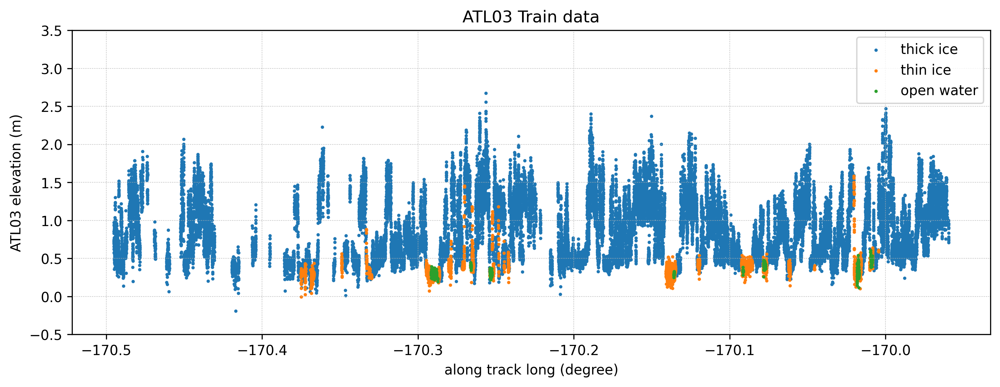

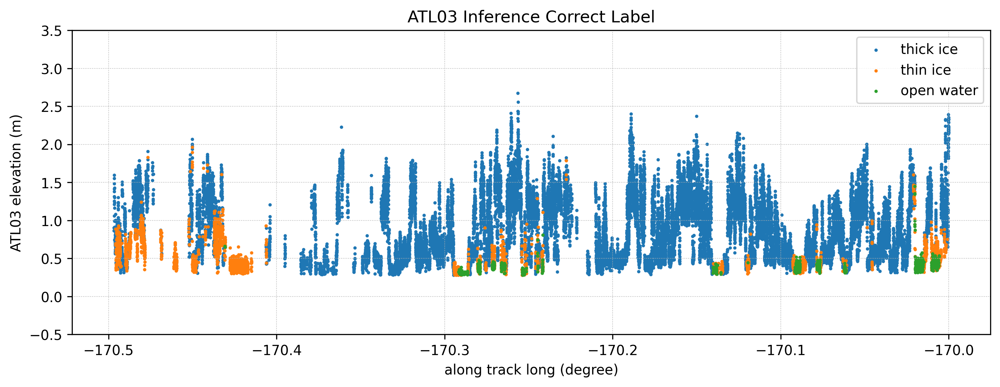

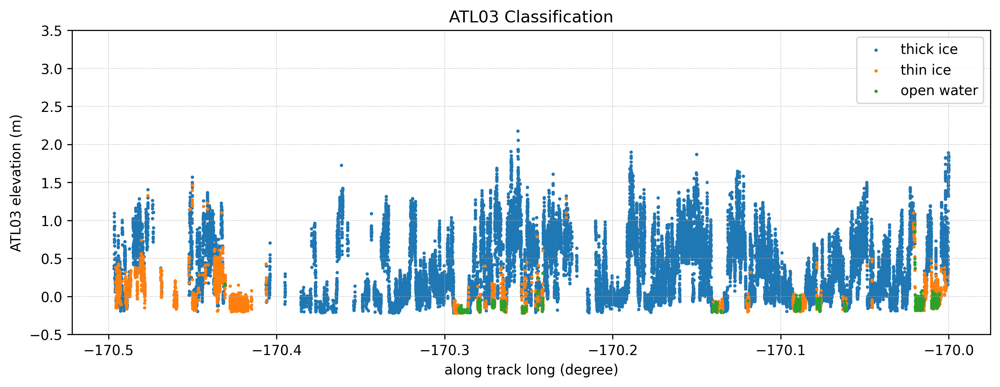

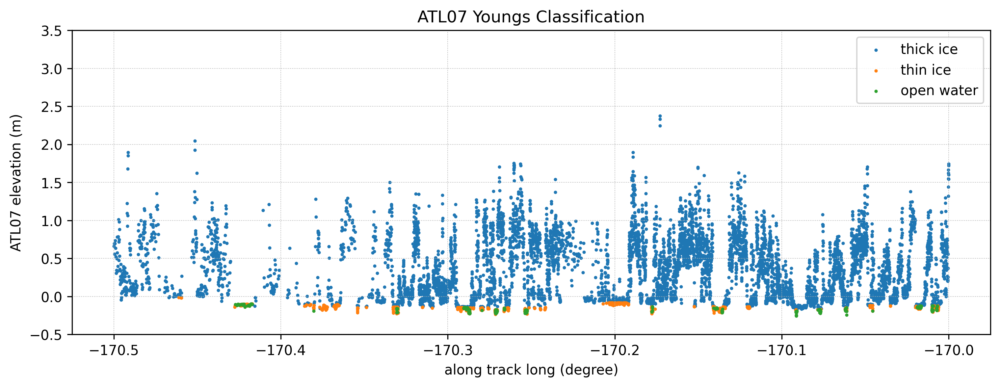

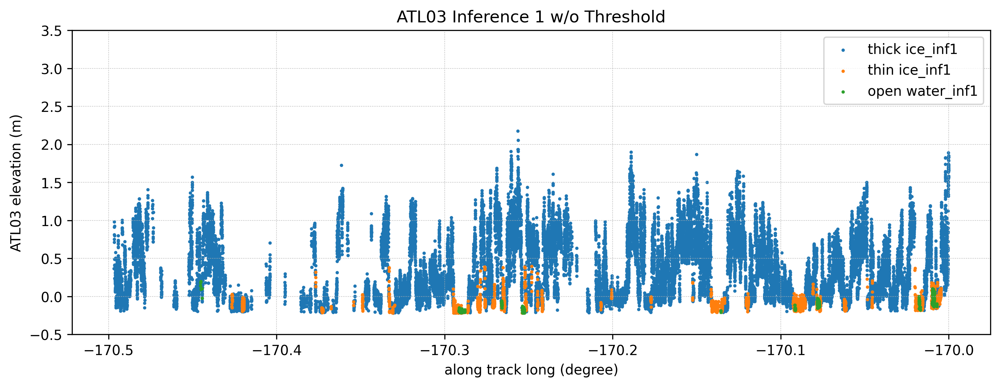

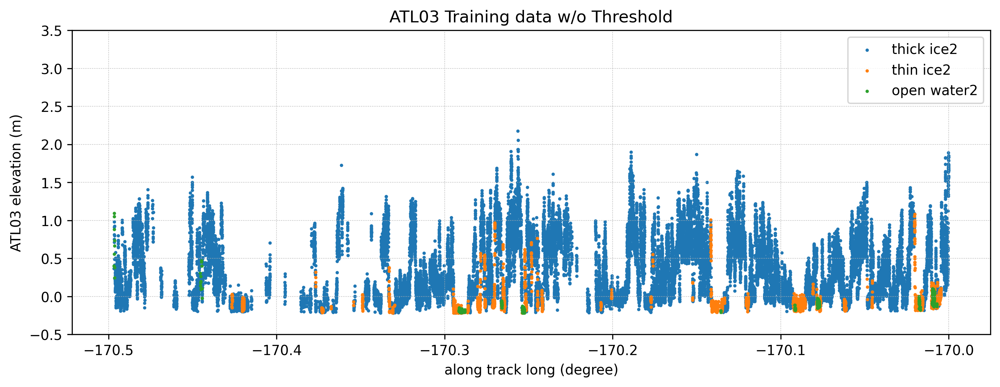

In [10]:
import glob, os
import time

# atl03_04 = LSTM_pred[(LSTM_pred['day'] == 4) & (LSTM_pred['track'] == "gt2r")]
# atl03_04
day = 4
beam = "gt2r"
lon1 = -170.5 #-171.0
lon2 = -170.0
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_04 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_04

dup_removed = atl03_04.drop_duplicates(subset=['x_atc','label_y'])
print(dup_removed.shape)
dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)
#display(dup_removed)
#h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
h_diff_avg = dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.2+h_diff_avg
thinice_offset = 0.4+h_diff_avg
print(dup_removed['new_h_ref'].mean())
from scipy.signal import savgol_filter
# Define the window size
window_size = 10000
def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]

dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]

print("ATL07 vs ATL03 vs ATL03 labeled Elevation")

train = pd.read_csv("ATL03_labeled_data/cor_labeled_by_is2trackline_10m/done/ATL03_20191104195311_05940510_T02CNC_gt2r_labeled_10m_done.csv")
train
# re-extract the data
thick_ice1 = train[(train.label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice1 = train[(train.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water1 = train[(train.label == 2)]#&(merged_data.h_cor_mean <= water_offset)]
print(thick_ice1.shape[0])
print(thin_ice1.shape[0])
print(water1.shape[0])

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Train data')
field = 'h_cor_mean'
plt.scatter(thick_ice1.lon, thick_ice1[field], s = 2, c='C0')
plt.scatter(thin_ice1.lon, thin_ice1[field], s = 2, c='C1')
plt.scatter(water1.lon, water1[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Classification')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.savefig('atl03_04_classification_cor_label.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.savefig('atl07_04_classification.png')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


(20531, 79)
0.5254625705714687
0.5775735170656423
csv_Iqrah/ATL07-02_20191126172006_09290501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191126182014_09290510_gt2r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation
18770
471
1670


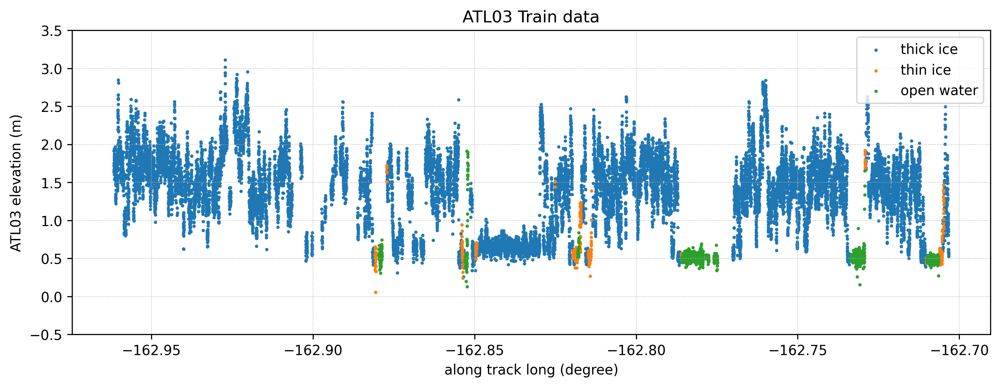

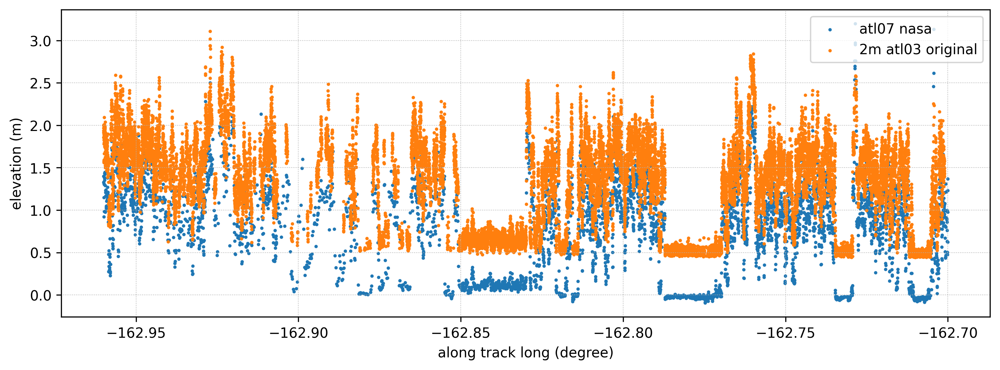

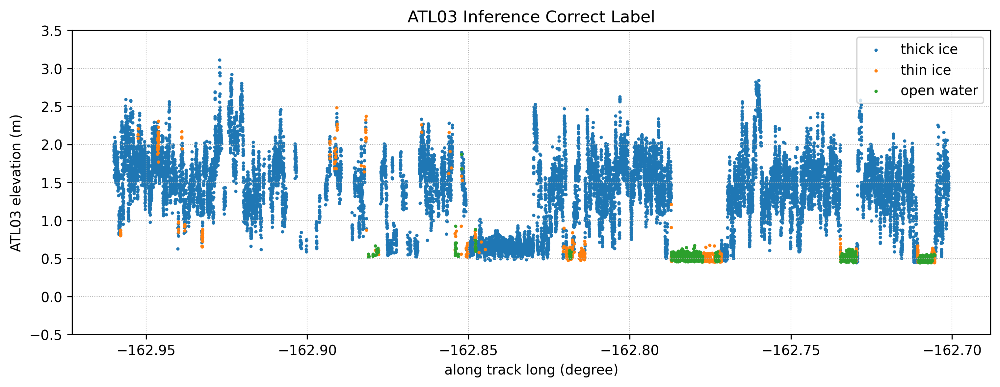

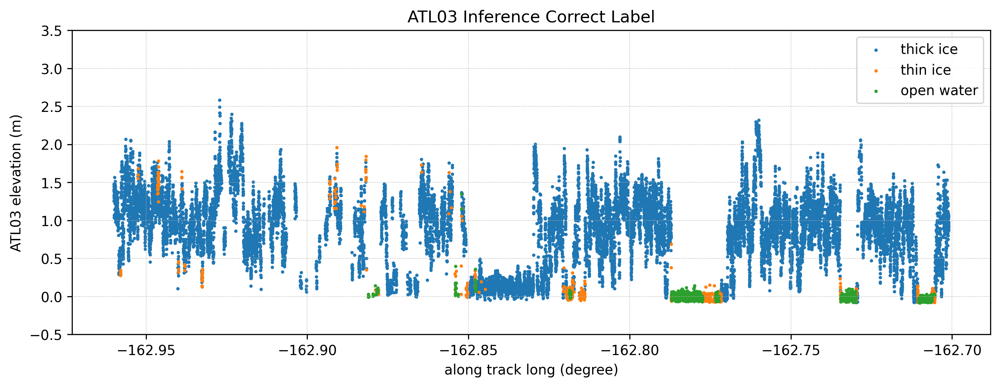

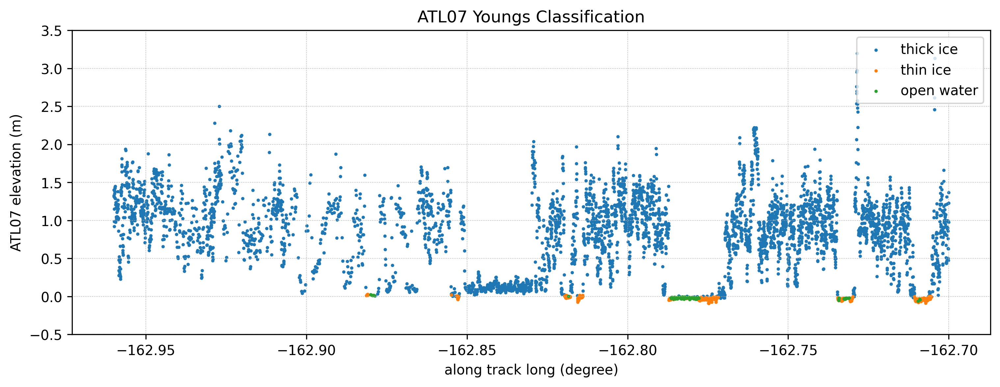

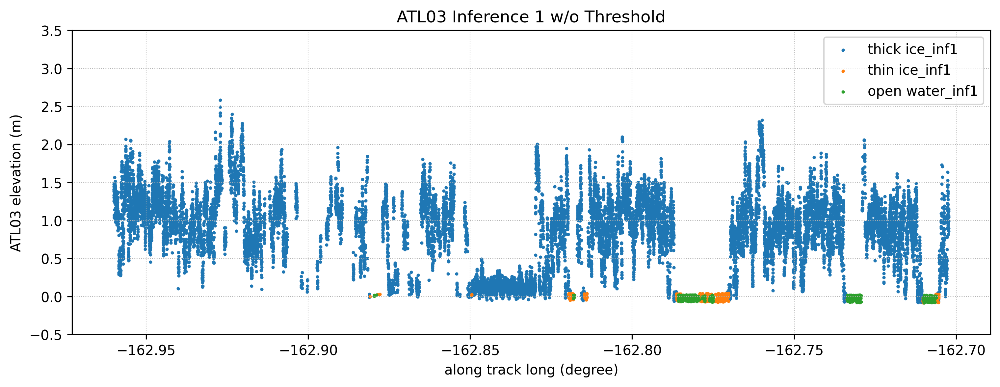

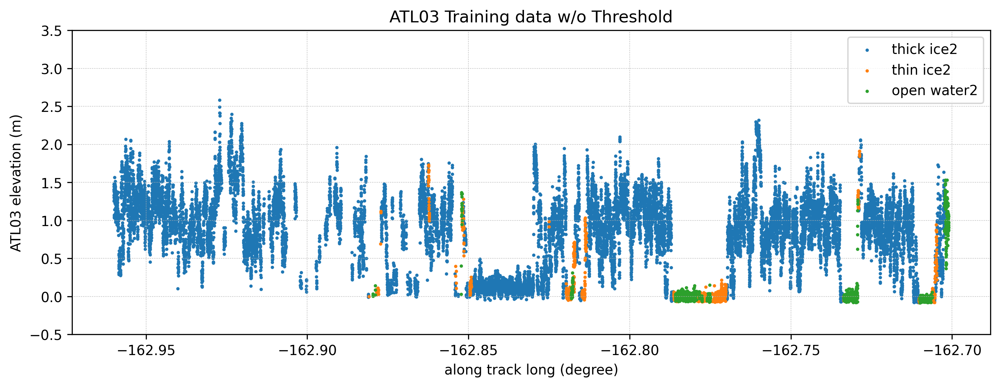

In [11]:
# atl03_26 = LSTM_pred[(LSTM_pred['day'] == 26) & (LSTM_pred['track'] == "gt2r")]
# atl03_26
day = 26
beam = "gt2r"
lon1 = -162.96
lon2 = -162.7
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_26 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_26

dup_removed = atl03_26.drop_duplicates(subset=['x_atc','label_y'])
#dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])

print(dup_removed.shape)

dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)


#display(dup_removed)
#h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
h_diff_avg = dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
#dup_removed = dup_removed[(dup_removed.new_h_ref < new_h_ref_offset)]
print(dup_removed['new_h_ref'].mean())

from scipy.signal import savgol_filter
## Smooth data using Savitzky-Golay filter
#y_smoothed = savgol_filter(y, window_length=11, polyorder=2)

# Define the window size
window_size = 10000

def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]

dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]


print("ATL07 vs ATL03 vs ATL03 labeled Elevation")

train = pd.read_csv("ATL03_labeled_data/cor_labeled_by_is2trackline_10m/done/ATL03_20191126182014_09290510_T03CWT_gt2r_labeled_10m_done.csv")
train
# re-extract the data
thick_ice1 = train[(train.label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice1 = train[(train.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water1 = train[(train.label == 2)]#&(merged_data.h_cor_mean <= water_offset)]
print(thick_ice1.shape[0])
print(thin_ice1.shape[0])
print(water1.shape[0])

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Train data')
field = 'h_cor_mean'
plt.scatter(thick_ice1.lon, thick_ice1[field], s = 2, c='C0')
plt.scatter(thin_ice1.lon, thin_ice1[field], s = 2, c='C1')
plt.scatter(water1.lon, water1[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


plt.figure(figsize = (12,4), dpi=300)
field = 'height'
plt.scatter(atl07_data.lon, atl07_data[field], s = 2, c = 'C0')
# field = 'h_cor_mean'
# plt.scatter(atl03_data.lon, atl03_data[field], s = 2, c = 'C2')
field = 'h_cor_mean'
plt.scatter(merged_data.lon, merged_data[field], s = 2, c = 'C1')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('elevation (m)')
plt.legend([' atl07 nasa', ' 2m atl03 original', ' 2m atl03 (labeled s2 overlap)'],loc='upper right')
plt.show()


plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.savefig('atl03_26_classification_cor_label.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.savefig('atl07_26_classification.png')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


(145008, 79)
0.5648333563214161
0.9555816507701664
csv_Iqrah/ATL07-02_20191103174424_05780501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191103184432_05780510_gt1r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation


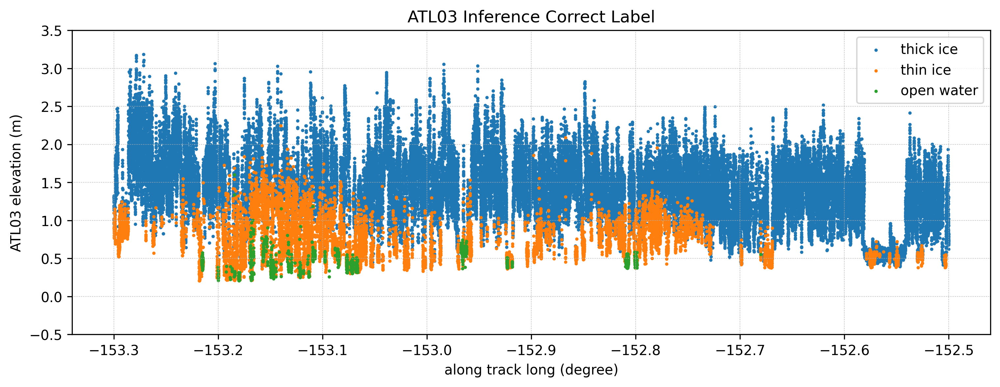

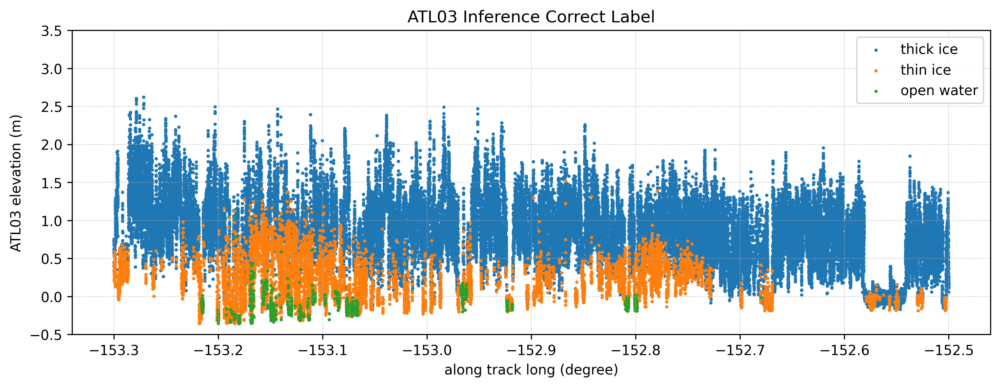

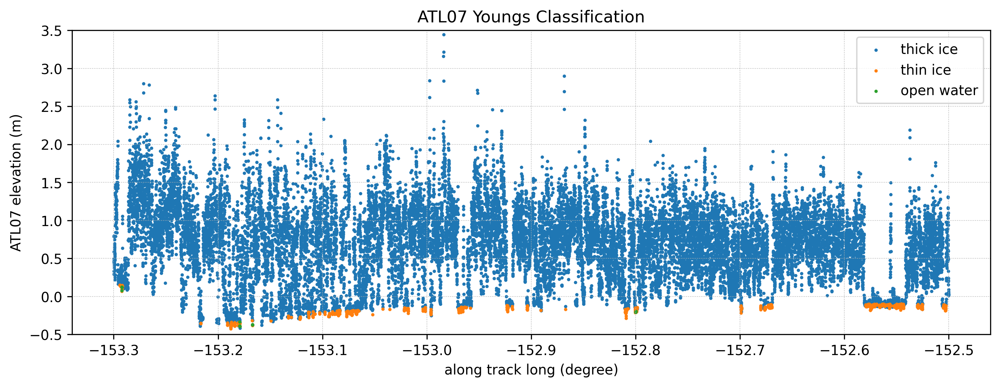

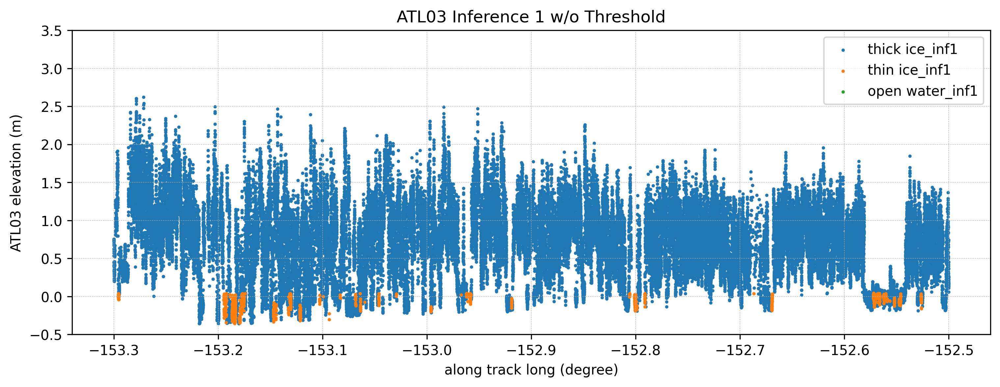

In [ ]:
# atl03_26 = LSTM_pred[(LSTM_pred['day'] == 26) & (LSTM_pred['track'] == "gt2r")]
# atl03_26
day = 3
beam = "gt1r"
lon1 = -153.3
lon2 = -152.5
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_26 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_26

dup_removed = atl03_26.drop_duplicates(subset=['x_atc','label_y'])
#dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])

print(dup_removed.shape)

dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)


#display(dup_removed)
h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
#dup_removed = dup_removed[(dup_removed.new_h_ref < new_h_ref_offset)]
print(dup_removed['new_h_ref'].mean())

from scipy.signal import savgol_filter
## Smooth data using Savitzky-Golay filter
#y_smoothed = savgol_filter(y, window_length=11, polyorder=2)

# Define the window size
window_size = 10000

def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]


dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]

print("ATL07 vs ATL03 vs ATL03 labeled Elevation")


plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


(89416, 79)
0.5648333563214161
0.5082521446975264
csv_Iqrah/ATL07-02_20191113181045_07310501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191113191053_07310510_gt1r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation


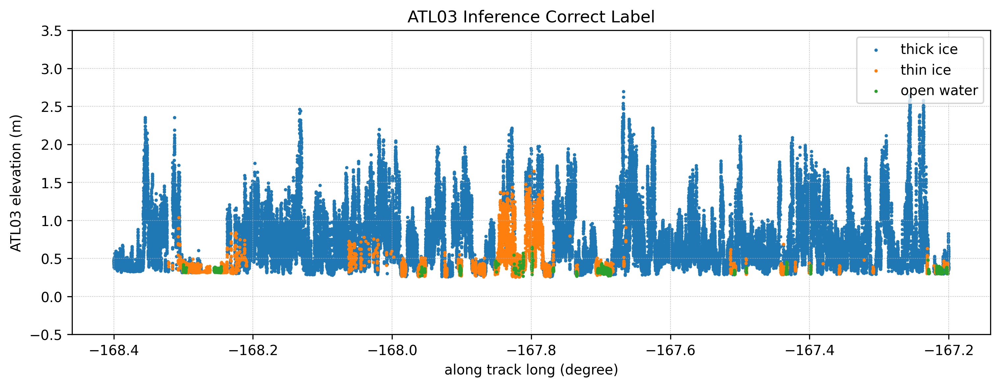

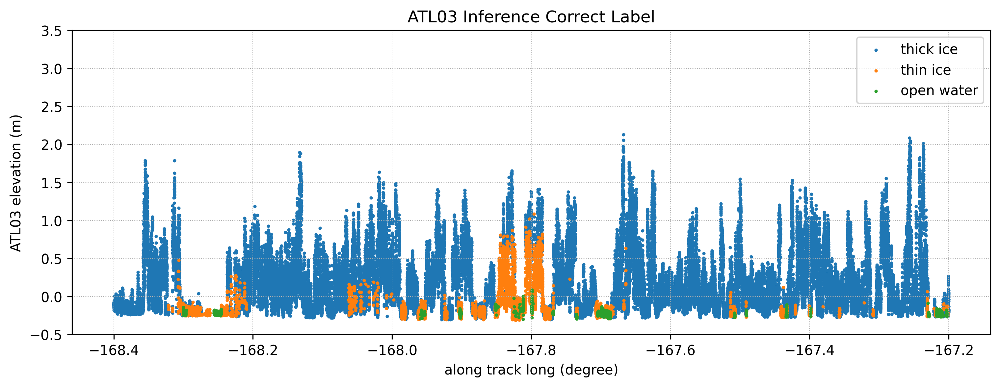

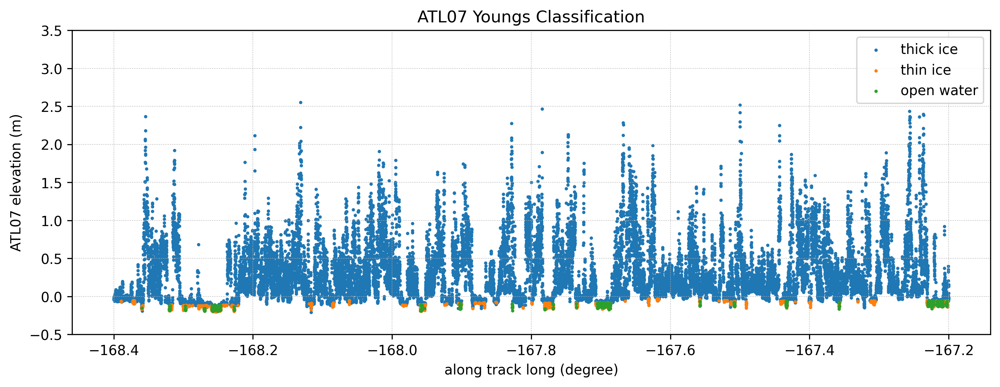

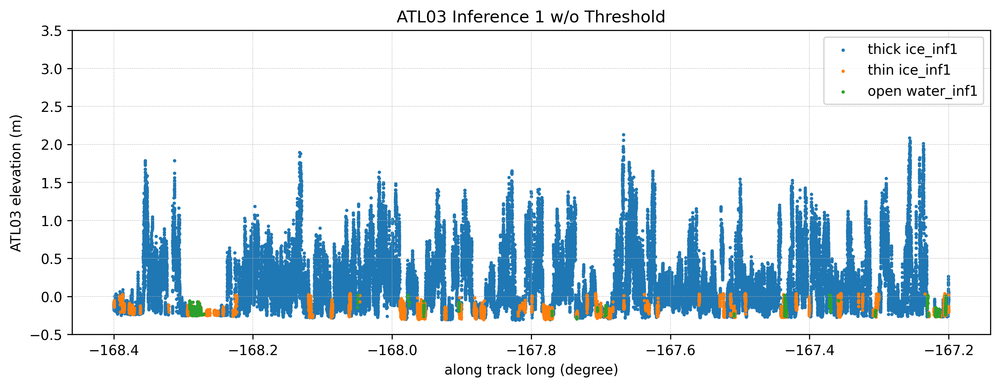

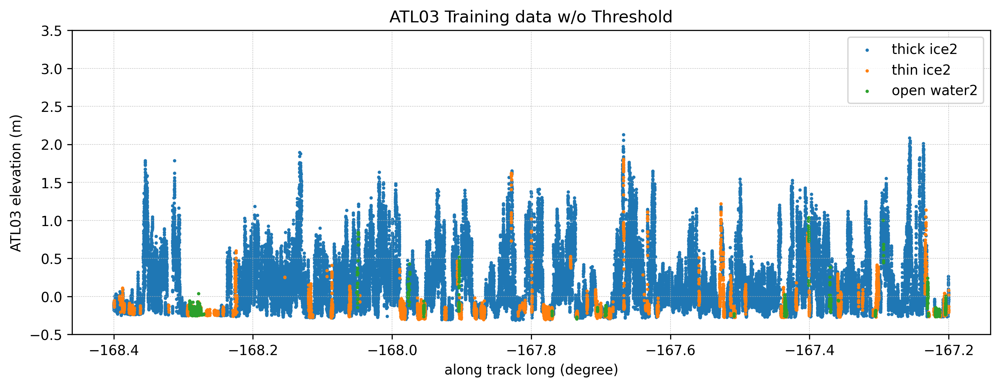

In [13]:
# atl03_26 = LSTM_pred[(LSTM_pred['day'] == 26) & (LSTM_pred['track'] == "gt2r")]
# atl03_26
day = 13
beam = "gt1r"
lon1 = -168.4
lon2 = -167.2
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_26 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_26

dup_removed = atl03_26.drop_duplicates(subset=['x_atc','label_y'])
#dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])

print(dup_removed.shape)

dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)


#display(dup_removed)
h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
#dup_removed = dup_removed[(dup_removed.new_h_ref < new_h_ref_offset)]
print(dup_removed['new_h_ref'].mean())

from scipy.signal import savgol_filter
## Smooth data using Savitzky-Golay filter
#y_smoothed = savgol_filter(y, window_length=11, polyorder=2)

# Define the window size
window_size = 10000

def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]


dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]

print("ATL07 vs ATL03 vs ATL03 labeled Elevation")

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


(55269, 79)
0.5648333563214161
0.7638449858547035
csv_Iqrah/ATL07-02_20191120181944_08380501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191120191952_08380510_gt2r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation


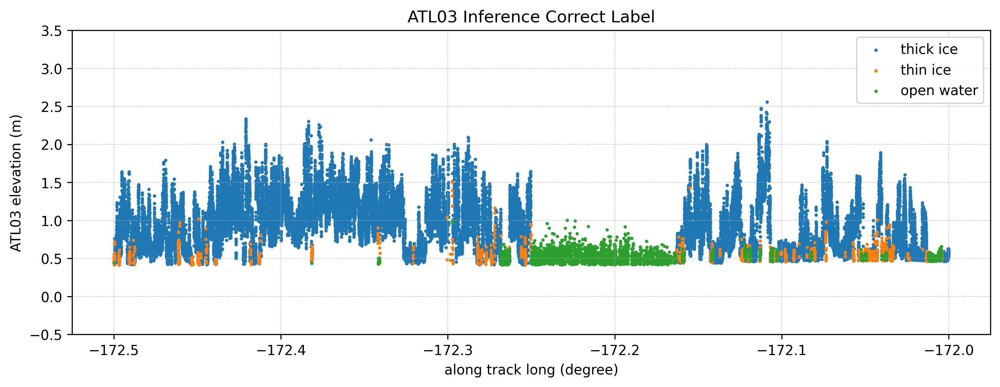

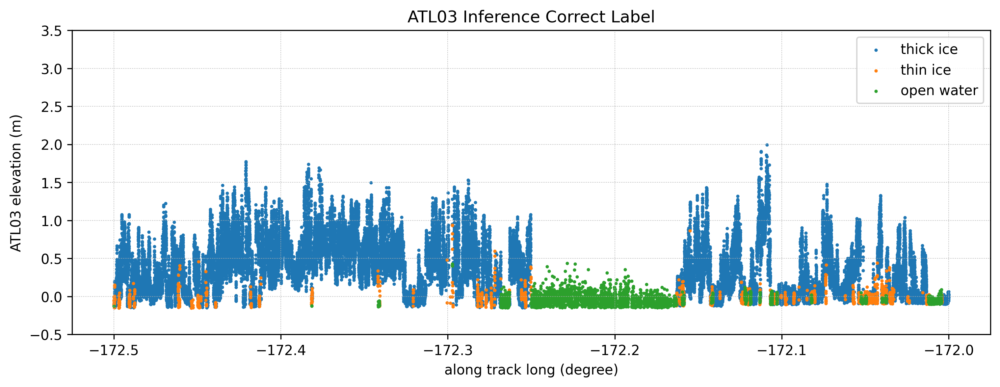

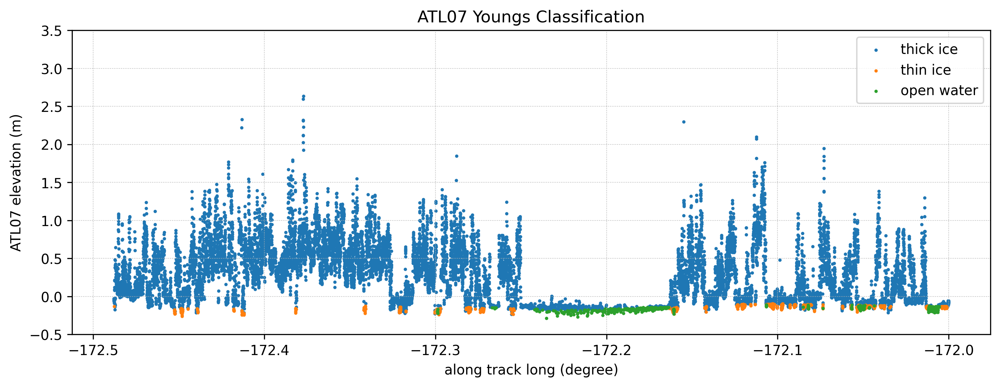

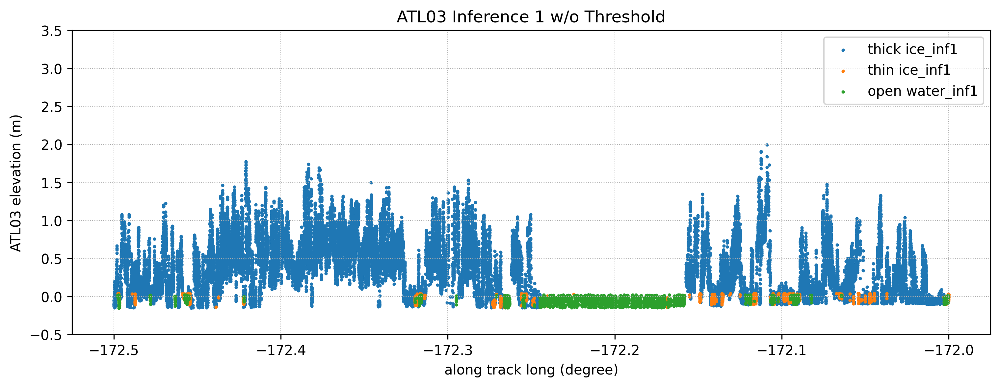

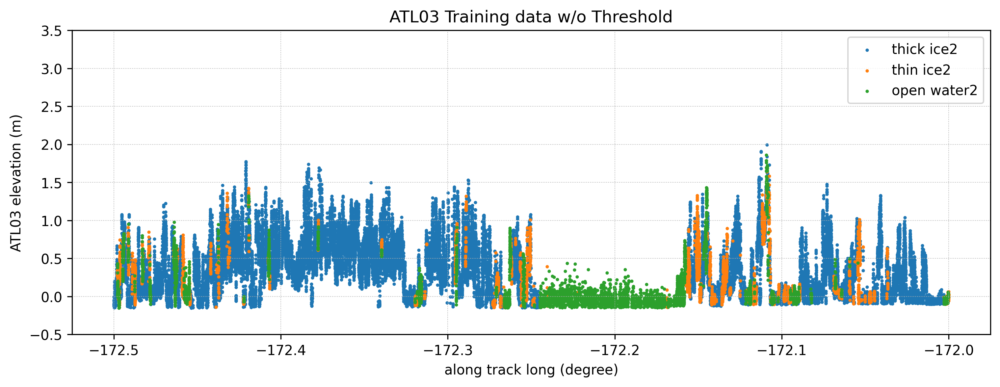

In [14]:
# atl03_26 = LSTM_pred[(LSTM_pred['day'] == 26) & (LSTM_pred['track'] == "gt2r")]
# atl03_26
day = 20
beam = "gt1r"
lon1 = -172.5
lon2 = -172.0
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_26 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_26

dup_removed = atl03_26.drop_duplicates(subset=['x_atc','label_y'])
#dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])

print(dup_removed.shape)

dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)


#display(dup_removed)
h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
#dup_removed = dup_removed[(dup_removed.new_h_ref < new_h_ref_offset)]
print(dup_removed['new_h_ref'].mean())

from scipy.signal import savgol_filter
## Smooth data using Savitzky-Golay filter
#y_smoothed = savgol_filter(y, window_length=11, polyorder=2)

# Define the window size
window_size = 10000

def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]


dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]

print("ATL07 vs ATL03 vs ATL03 labeled Elevation")


plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


(126435, 79)
0.5648333563214161
0.7242129958500685
csv_Iqrah/ATL07-02_20191123170246_08830501_005_01.csv
ATL03_Nov_2019_down2023/csv/ATL03_20191123193712_08840510_gt1r.csv
ATL07 vs ATL03 vs ATL03 labeled Elevation


<Figure size 3600x1200 with 0 Axes>

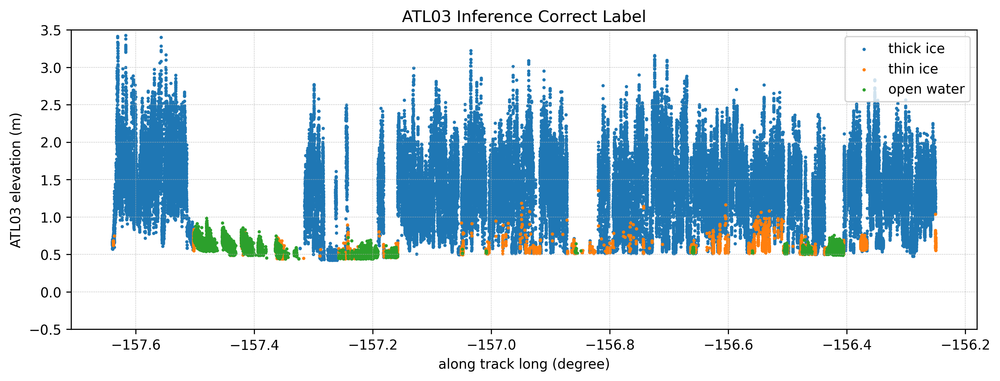

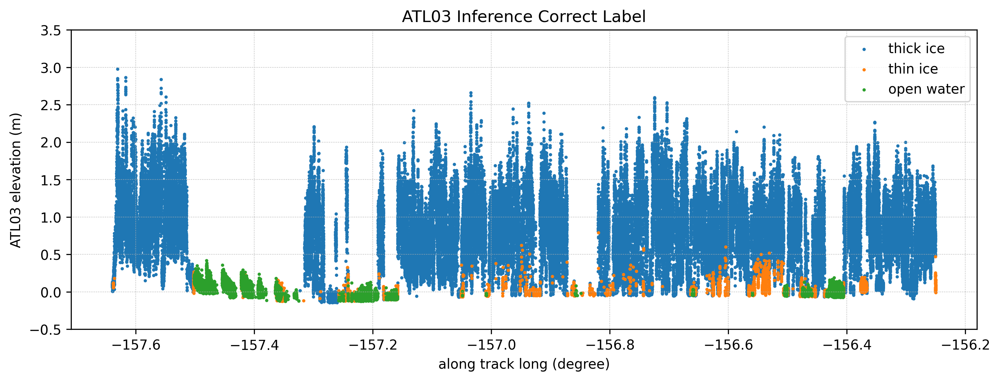

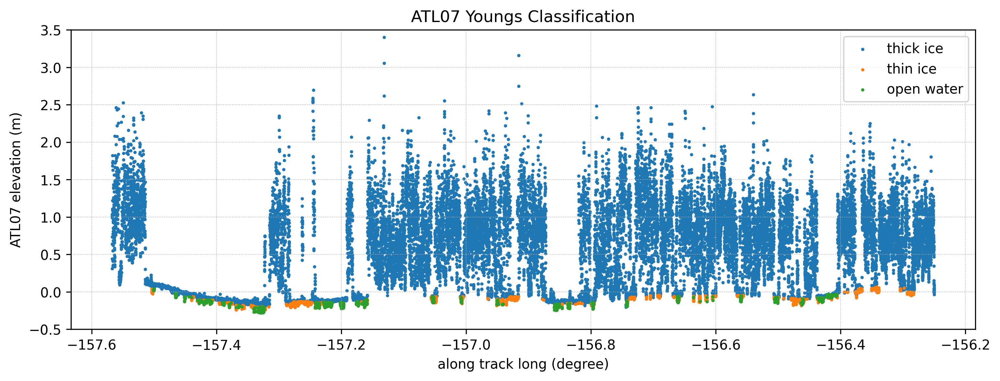

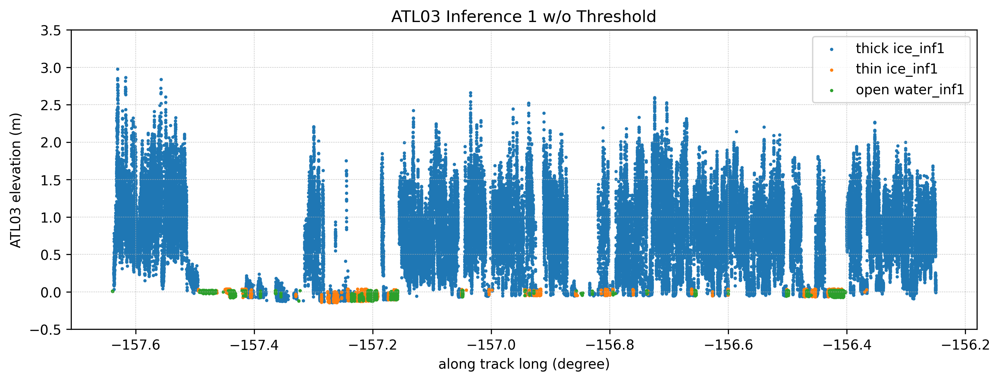

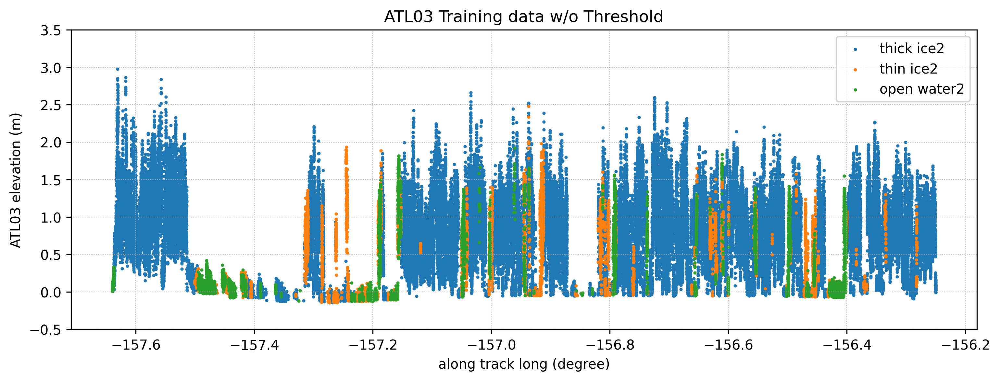

In [15]:
# atl03_26 = LSTM_pred[(LSTM_pred['day'] == 26) & (LSTM_pred['track'] == "gt2r")]
# atl03_26
day = 23
beam = "gt2r"
lon1 = -157.75
lon2 = -156.25
#track_field = #'track'#'track_x'
track_field = 'track_x'
atl03_26 = LSTM_pred_threshold[(LSTM_pred_threshold['day'] == day) & (LSTM_pred_threshold[track_field] == beam)]
atl03_26

dup_removed = atl03_26.drop_duplicates(subset=['x_atc','label_y'])
#dup_removed = labeled_data.drop_duplicates(subset=['x_atc'])

print(dup_removed.shape)

dup_removed = dup_removed.sort_values(by=['x_atc'])
dup_removed = dup_removed.reset_index(drop=True)


#display(dup_removed)
h_diff_avg = h_diff_avg_all#dup_removed['height_diff_03_07'].mean()
print(h_diff_avg)
water_offset = 0.02+h_diff_avg
thinice_offset = 0.04+h_diff_avg
#dup_removed = dup_removed[(dup_removed.new_h_ref < new_h_ref_offset)]
print(dup_removed['new_h_ref'].mean())

from scipy.signal import savgol_filter
## Smooth data using Savitzky-Golay filter
#y_smoothed = savgol_filter(y, window_length=11, polyorder=2)

# Define the window size
window_size = 10000

def smooth_line(data, w = 2):
    # Smooth the surface with the defined window size
    output = np.zeros(len(data))
    for n in range(0, len(data)):
        output[n] = np.nanmin(data[max(0, n-w):min(len(data), n+w+1)])
    return output
# Calculate the rolling average
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
dup_removed['new_h_ref_smooth']  = smooth_line(dup_removed['new_h_ref_smooth'], w = 10000)
dup_removed['new_h_ref_smooth'] = dup_removed['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
dup_removed['freeboard_new_h_ref_smooth'] = dup_removed['h_cor_mean'] - dup_removed['new_h_ref_smooth']

merged_data = dup_removed.copy()
merged_data = merged_data[(merged_data['lon'] >= lon1) & (merged_data['lon'] <= lon2)]

# re-extract the data
thick_ice = merged_data[(merged_data.pred_label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = merged_data[(merged_data.pred_label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = merged_data[(merged_data.pred_label == 2)]#&(merged_data.h_cor_mean <= water_offset)]

# re-extract the data
thick_ice2 = merged_data[(merged_data.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice2 = merged_data[(merged_data.label_y == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water2 = merged_data[(merged_data.label_y == 2)]#&(merged_data.h_cor_mean <= water_offset)]


dir07_path = "csv_Iqrah/"
dir03_path = "ATL03_Nov_2019_down2023/csv/"

date = "201911" + str(day).zfill(2)

atl07_file = glob.glob(dir07_path + "ATL07-02_" + date + "*.csv")
print(atl07_file[0])
atl07_data = pd.read_csv(atl07_file[0], index_col=0)
atl07_data = atl07_data[atl07_data.beam == beam]
atl07_data = atl07_data.sort_values(by=['x'])
atl07_data = atl07_data.reset_index(drop=True)
#display(atl07_data)

atl03_file = glob.glob(dir03_path + "ATL03_" + date + "*.csv")
print(atl03_file[0])
atl03_data = pd.read_csv(atl03_file[0], index_col=0)
atl03_data = atl03_data.sort_values(by=['x'])
atl03_data = atl03_data.reset_index(drop=True)
atl03_data = atl03_data[(atl03_data.h_cor_mean <= 15)]
#display(atl03_data)

atl07_data = atl07_data[(atl07_data['lon'] >= lon1) & (atl07_data['lon'] <= lon2)]
atl03_data = atl03_data[(atl03_data['lon'] >= lon1) & (atl03_data['lon'] <= lon2)]

# re-extract the data
thick_ice3 = atl07_data[(atl07_data.label == 2)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice3 = atl07_data[(atl07_data.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water3 = atl07_data[(atl07_data.label == 0)]#&(merged_data.h_cor_mean <= water_offset)]

print("ATL07 vs ATL03 vs ATL03 labeled Elevation")


plt.figure(figsize = (12,4), dpi=300)

# field = 'height'
# plt.scatter(atl07_data.lon, atl07_data[field], s = 2, c = 'C0')
# # field = 'h_cor_mean'
# # plt.scatter(atl03_data.lon, atl03_data[field], s = 2, c = 'C2')
# field = 'h_cor_mean'
# plt.scatter(merged_data.lon, merged_data[field], s = 2, c = 'C1')
# plt.grid(linestyle = ':', linewidth = 0.5)
# plt.xlabel('along track long (degree)')
# plt.ylabel('elevation (m)')
# plt.legend([' atl07 nasa', ' 2m atl03 original', ' 2m atl03 (labeled s2 overlap)'],loc='upper right')
# plt.show()


plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference Correct Label')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water.lon, water[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL07 Youngs Classification')
field = 'height'
plt.scatter(thick_ice3.lon, thick_ice3[field], s = 2, c='C0')
plt.scatter(thin_ice3.lon, thin_ice3[field], s = 2, c='C1')
plt.scatter(water3.lon, water3[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL07 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()

### --------------------- inference 1 data --------------------- ###
atl03_inf1 = LSTM_pred[(LSTM_pred['day'] == day) & (LSTM_pred['track'] == beam)]
atl03_inf1 = atl03_inf1.drop_duplicates(subset=['x_atc','label_y'])
atl03_inf1 = atl03_inf1.sort_values(by=['x_atc'])
atl03_inf1 = atl03_inf1.reset_index(drop=True)
# Calculate the rolling average
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref'].apply(lambda x: x if x <= water_offset else np.nan)
atl03_inf1['new_h_ref_smooth']  = smooth_line(atl03_inf1['new_h_ref_smooth'], w = 10000)
atl03_inf1['new_h_ref_smooth'] = atl03_inf1['new_h_ref_smooth'].interpolate(method='nearest', limit_direction='both', axis=0)
### freeboard calculation
atl03_inf1['freeboard_new_h_ref_smooth'] = atl03_inf1['h_cor_mean'] - atl03_inf1['new_h_ref_smooth']

atl03_inf1 = atl03_inf1[(atl03_inf1['lon'] >= lon1) & (atl03_inf1['lon'] <= lon2)]
# re-extract the data
thick_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice_inf1 = atl03_inf1[(atl03_inf1.label_y == 1)&(atl03_inf1.h_cor_mean <= thinice_offset)]
water_inf1 = atl03_inf1[(atl03_inf1.label_y == 2)&(atl03_inf1.h_cor_mean <= water_offset)]

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Inference 1 w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice_inf1.lon, thick_ice_inf1[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice_inf1.lon, thin_ice_inf1[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water_inf1.lon, water_inf1[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice_inf1', 'thin ice_inf1', 'open water_inf1'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()

plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Training data w/o Threshold')
field = 'h_cor_mean'
plt.scatter(thick_ice2.lon, thick_ice2[field]-h_diff_avg, s = 2, c='C0')
plt.scatter(thin_ice2.lon, thin_ice2[field]-h_diff_avg, s = 2, c='C1')
plt.scatter(water2.lon, water2[field]-h_diff_avg, s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice2', 'thin ice2', 'open water2'],loc='upper right')
#plt.savefig('elev04_atl03.png')
#plt.savefig('elev04_atl03_new_param.png')
#plt.savefig('elev04_atl03_new_param2.png')
plt.show()


In [16]:
print("hello")

hello
